In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import config

In [7]:

crime_data = pd.read_csv("./datasets/cleaned_crime_data.csv")
crime_data.head(5)

,ID,Case Number,Date,Primary Type,Description,Arrest,Domestic,District,Ward,Community Area,...,Month,Latitude,Longitude,primary_type_count,total_crimes_per_yr,monthly_crime_count,generalized_loc,Lat_round,Lon_round,location_crime_count
0,13311263,JG503434,2022-07-29 03:39:00,OFFENSE INVOLVING CHILDREN,CHILD PORNOGRAPHY,True,False,10.0,25.0,30.0,...,7,NaN,NaN,9676,224691,20979,Residential,NaN,NaN,NaN
1,13053066,JG103252,2023-01-03 16:44:00,NARCOTICS,MANUFACTURE / DELIVER - CRACK,True,False,11.0,28.0,26.0,...,1,NaN,NaN,31555,246748,19935,Street/Outdoor,NaN,NaN,NaN
2,13203321,JG415333,2023-09-06 17:00:00,CRIMINAL DAMAGE,TO VEHICLE,False,False,1.0,42.0,32.0,...,9,41.886018,-87.633938,141930,246748,21305,Residential,41.886,-87.634,278.0
3,13204489,JG416325,2023-09-06 11:00:00,THEFT,OVER $500,False,False,1.0,4.0,32.0,...,9,41.871835,-87.626151,268613,246748,21305,Residential,41.872,-87.626,141.0
4,12419690,JE295655,2021-07-07 10:30:00,SEX OFFENSE,SEXUAL EXPLOITATION OF A CHILD,False,False,5.0,10.0,54.0,...,7,41.655116,-87.594883,6241,195093,18040,Residential,41.655,-87.595,65.0


In [4]:
crime_data.info() #Get all the type of each column

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1160667 entries, 0 to 1160666
Data columns (total 21 columns):
 #   Column                Non-Null Count    Dtype  
---  ------                --------------    -----  
 0   ID                    1160667 non-null  int64  
 1   Case Number           1160667 non-null  object 
 2   Date                  1160667 non-null  object 
 3   Primary Type          1160667 non-null  object 
 4   Description           1160667 non-null  object 
 5   Arrest                1160667 non-null  bool   
 6   Domestic              1160667 non-null  bool   
 7   District              1160667 non-null  float64
 8   Ward                  1160641 non-null  float64
 9   Community Area        1160665 non-null  float64
 10  Year                  1160667 non-null  int64  
 11  Month                 1160667 non-null  int64  
 12  Latitude              1143767 non-null  float64
 13  Longitude             1143767 non-null  float64
 14  primary_type_count    1160667 non-

In [4]:
crime_data.describe()

,ID,District,Ward,Community Area,Year,Month,Latitude,Longitude,primary_type_count,total_crimes_per_yr,monthly_crime_count,Lat_round,Lon_round,location_crime_count
count,1.160667e+06,1.160667e+06,1.160641e+06,1.160665e+06,1.160667e+06,1.160667e+06,1.143767e+06,1.143767e+06,1.160667e+06,1.160667e+06,1.160667e+06,1.143767e+06,1.143767e+06,1.143767e+06
mean,1.283979e+07,1.130182e+01,2.322724e+01,3.644929e+01,2.022255e+03,6.445004e+00,4.184535e+01,-8.766901e+01,1.547673e+05,2.154010e+05,1.863272e+04,4.184535e+01,-8.766901e+01,1.122379e+02
std,8.949611e+05,7.039767e+00,1.400071e+01,2.157916e+01,1.500588e+00,3.432418e+00,8.750097e-02,5.950584e-02,8.765176e+04,4.099789e+04,2.606707e+03,8.749990e-02,5.950678e-02,1.830702e+02
min,2.488900e+04,1.000000e+00,1.000000e+00,1.000000e+00,2.020000e+03,1.000000e+00,3.661945e+01,-9.168657e+01,6.400000e+01,5.410300e+04,4.949000e+03,3.661900e+01,-9.168700e+01,1.000000e+00
25%,1.241483e+07,6.000000e+00,1.000000e+01,2.200000e+01,2.021000e+03,3.000000e+00,4.176942e+01,-8.771087e+01,9.018700e+04,1.995740e+05,1.686700e+04,4.176900e+01,-8.771100e+01,2.700000e+01
50%,1.288483e+07,1.000000e+01,2.400000e+01,3.200000e+01,2.022000e+03,7.000000e+00,4.186291e+01,-8.766241e+01,1.419300e+05,2.246910e+05,1.857700e+04,4.186300e+01,-8.766200e+01,5.600000e+01
75%,1.333916e+07,1.700000e+01,3.400000e+01,5.300000e+01,2.024000e+03,9.000000e+00,4.190877e+01,-8.762702e+01,2.235660e+05,2.404580e+05,2.097900e+04,4.190900e+01,-8.762700e+01,1.220000e+02
max,1.380835e+07,3.100000e+01,5.000000e+01,7.700000e+01,2.025000e+03,1.200000e+01,4.202259e+01,-8.752453e+01,2.686130e+05,2.467480e+05,2.284500e+04,4.202300e+01,-8.752500e+01,2.179000e+03


#Crime Rate Analysis based on multiple features

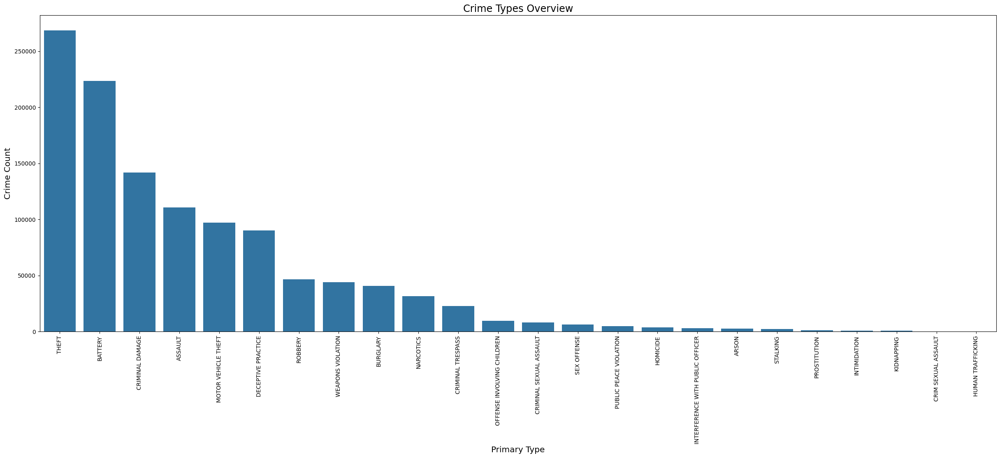

In [5]:
# --- OVERVIEW OF THE CRIME ---

plt.figure(figsize=(30, 10))

crime_types = crime_data.groupby('Primary Type', as_index=False).size()
assault_types = crime_data[crime_data['Primary Type'] == 'ASSAULT'].groupby('Description', as_index=False).size()
auto_theft_types = crime_data[crime_data['Primary Type'] == 'MOTOR VEHICLE THEFT'].groupby('Description', as_index=False).size()

# plt.subplot(221)
sns.barplot(x='Primary Type', y='size', data=crime_types.sort_values(by='size', ascending=False))
plt.title('Crime Types Overview', fontsize='xx-large')
plt.xlabel('Primary Type', fontsize='x-large')
plt.ylabel('Crime Count', fontsize='x-large')
plt.xticks(rotation=90)

# plt.tight_layout()
plt.show()


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16],
 [Text(0, 0, 'AUTOMOBILE'),
  Text(1, 0, 'ATTEMPT - AUTOMOBILE'),
  Text(2, 0, 'THEFT / RECOVERY - AUTOMOBILE'),
  Text(3, 0, 'CYCLE, SCOOTER, BIKE WITH VIN'),
  Text(4, 0, 'TRUCK, BUS, MOTOR HOME'),
  Text(5, 0, 'CYCLE, SCOOTER, BIKE NO VIN'),
  Text(6, 0, 'THEFT / RECOVERY - TRUCK, BUS, MOBILE HOME'),
  Text(7, 0, 'THEFT/RECOVERY: AUTOMOBILE'),
  Text(8, 0, 'ATTEMPT - TRUCK, BUS, MOTOR HOME'),
  Text(9, 0, 'THEFT / RECOVERY - CYCLE, SCOOTER, BIKE WITH VIN'),
  Text(10, 0, 'ATTEMPT - CYCLE, SCOOTER, BIKE WITH VIN'),
  Text(11, 0, 'ATT: AUTOMOBILE'),
  Text(12, 0, 'THEFT / RECOVERY - CYCLE, SCOOTER, BIKE NO VIN'),
  Text(13, 0, 'ATTEMPT - CYCLE, SCOOTER, BIKE NO VIN'),
  Text(14, 0, 'THEFT/RECOVERY: TRUCK,BUS,MHOME'),
  Text(15, 0, 'CYCLE, SCOOTER, BIKE W-VIN'),
  Text(16, 0, 'ATT: TRUCK, BUS, MOTOR HOME')])

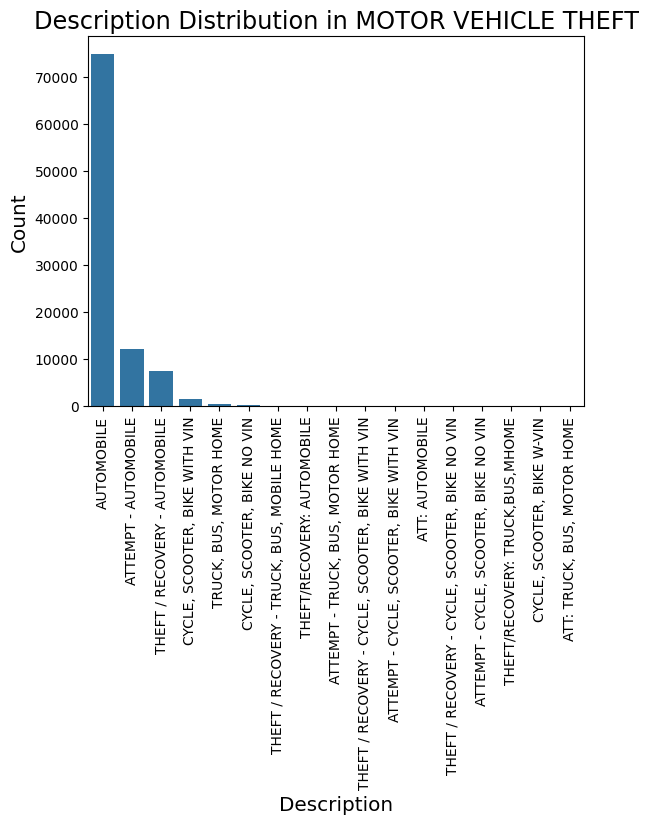

In [17]:
# --- OVERVIEW OF MOTOR VEHICLE THEFT ---

# plt.subplot(223)
sns.barplot(x='Description', y='size', data=auto_theft_types.sort_values(by='size', ascending=False))
plt.title('Description Distribution in MOTOR VEHICLE THEFT', fontsize='xx-large')
plt.xlabel('Description', fontsize='x-large')
plt.ylabel('Count', fontsize='x-large')
plt.xticks(rotation=90)
# plt.tight_layout()

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27],
 [Text(0, 0, 'SIMPLE'),
  Text(1, 0, 'AGGRAVATED - HANDGUN'),
  Text(2, 0, 'AGGRAVATED - KNIFE / CUTTING INSTRUMENT'),
  Text(3, 0, 'AGGRAVATED - OTHER DANGEROUS WEAPON'),
  Text(4, 0, 'PROTECTED EMPLOYEE - HANDS, FISTS, FEET, NO / MINOR INJURY'),
  Text(5, 0, 'AGGRAVATED - OTHER FIREARM'),
  Text(6, 0, 'AGGRAVATED POLICE OFFICER - HANDS, FISTS, FEET, NO INJURY'),
  Text(7, 0, 'AGGRAVATED: HANDGUN'),
  Text(8, 0, 'AGGRAVATED:KNIFE/CUTTING INSTR'),
  Text(9, 0, 'AGGRAVATED POLICE OFFICER - OTHER DANGEROUS WEAPON'),
  Text(10, 0, 'AGGRAVATED POLICE OFFICER - HANDGUN'),
  Text(11, 0, 'AGGRAVATED PROTECTED EMPLOYEE - OTHER DANGEROUS WEAPON'),
  Text(12, 0, 'AGGRAVATED PROTECTED EMPLOYEE - HANDGUN'),
  Text(13, 0, 'AGGRAVATED: OTHER DANG WEAPON'),
  Text(14, 0, 'PRO EMP HANDS NO/MIN INJURY'),
  Text(15, 0, 'AGGRAVATED PROTECTED EMPLOY

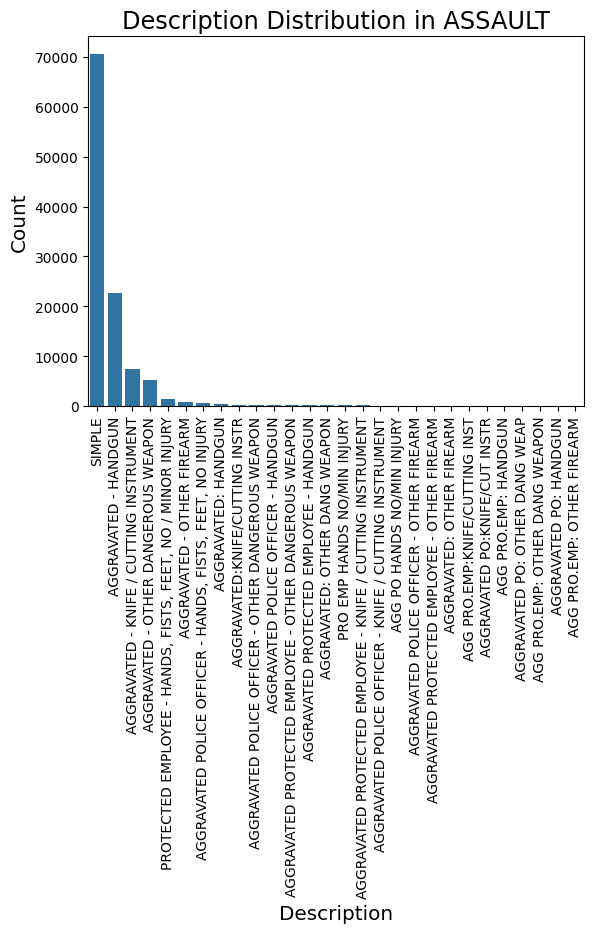

In [6]:
#  --- OVERVIEW OF ASSAULT ---

sns.barplot(x='Description', y='size', data=assault_types.sort_values(by='size', ascending=False))
plt.title('Description Distribution in ASSAULT', fontsize='xx-large')
plt.xlabel('Description', fontsize='x-large')
plt.ylabel('Count', fontsize='x-large')
plt.xticks(rotation=90)

/var/folders/qr/rbrd4g3d5gb_kj28hmnmz1km0000gn/T/ipykernel_5859/2147280969.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Year', y='Total Crimes', data=yearly_crimes, palette='Blues_d')


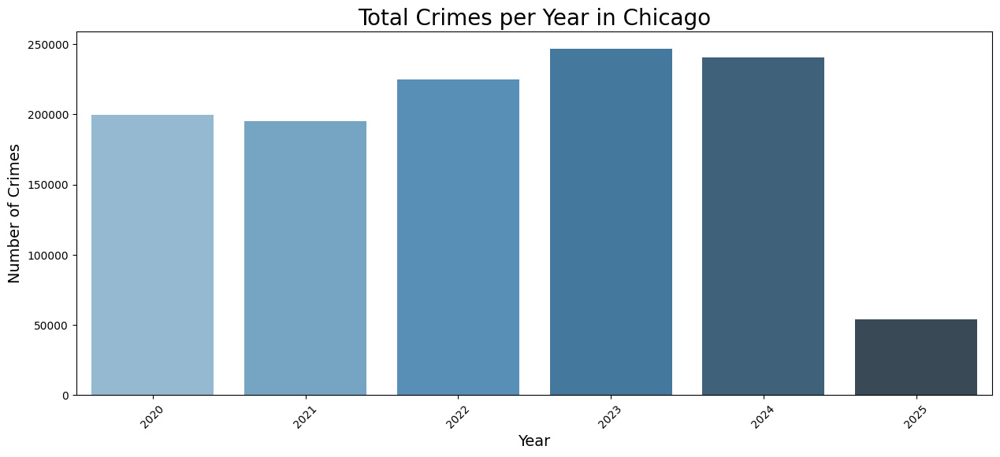

In [19]:
# --- PLOT BY YEAR ---

yearly_crimes = crime_data.groupby('Year').size().reset_index(name='Total Crimes')
plt.figure(figsize=(15, 6))
sns.barplot(x='Year', y='Total Crimes', data=yearly_crimes, palette='Blues_d')

plt.title('Total Crimes per Year in Chicago', fontsize=20)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Number of Crimes', fontsize=14)
plt.xticks(rotation=45)
plt.show()

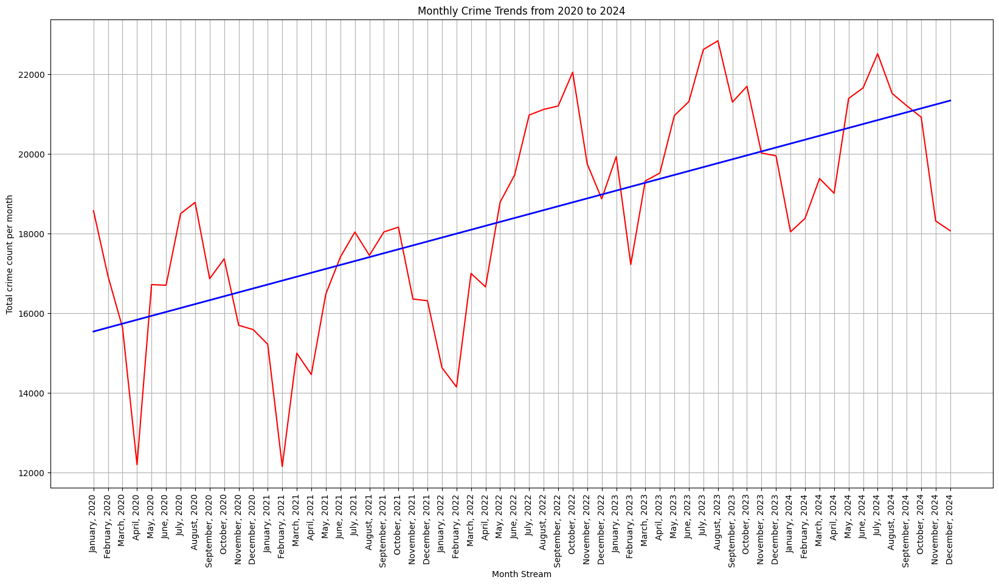

In [7]:
# --- PLOTTING MONTHLY CRIME IN FROM 2020 TO 2024 ---

# Map all the month in word format
month_dict = {
    1: "January",
    2: "February",
    3: "March",
    4: "April",
    5: "May",
    6: "June",
    7: "July",
    8: "August",
    9: "September",
    10: "October",
    11: "November",
    12: "December"
}

# Data filter from crime_data
crime_distribution = crime_data.groupby(by=["Year", "Month"], dropna=False, as_index=False).size()
crime_distribution = crime_distribution[crime_distribution["Year"] < 2025]
crime_distribution.rename(columns={'size': "Crime Count"}, inplace=True)
crime_distribution['Year'] = crime_distribution["Year"].astype(str)
crime_distribution["Month"] = crime_distribution["Month"].map(month_dict)
crime_distribution["MonthAndYear"] = crime_distribution["Month"] + ", " + crime_distribution["Year"]


x = np.arange(len(crime_distribution))  # Numeric index for months (0 to length-1)
coefficients = np.polyfit(x, crime_distribution["Crime Count"], deg=1)  # Linear fit (slope and intercept)
trend_line = np.polyval(coefficients, x)  # Evaluate the linear fit over x


# Plot the time series
plt.figure(figsize=(20,10))
plt.grid('on')
plt.plot(crime_distribution["MonthAndYear"], crime_distribution["Crime Count"], color="red")
plt.plot(crime_distribution["MonthAndYear"], trend_line, color="blue", label="Linear Trend", linewidth=2)
plt.xlabel("Month Stream")
plt.ylabel("Total crime count per month")
plt.xticks(np.arange(len(crime_distribution["Month"])), rotation=90)
plt.title("Monthly Crime Trends from 2020 to 2024")
plt.show()


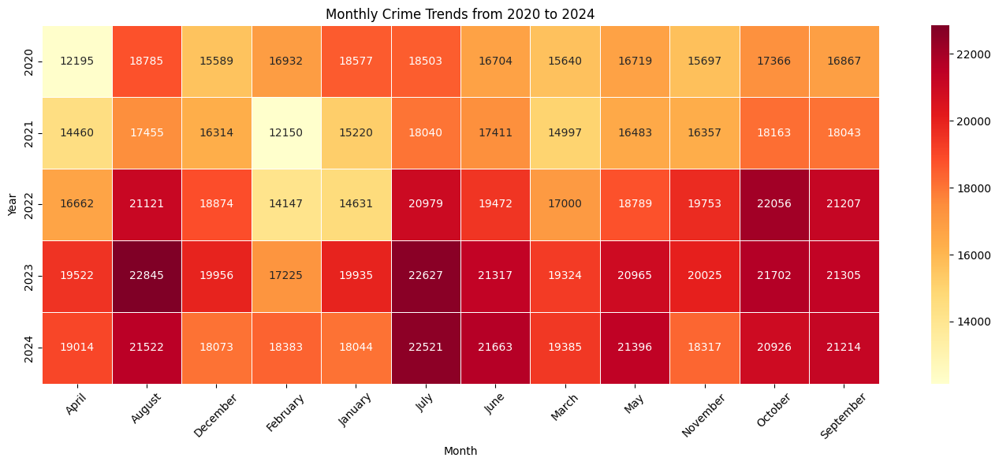

In [21]:
# --- PLOTTING THE DATA IN A HEATMAP ---
table = crime_distribution.pivot_table(index="Year", columns="Month", values="Crime Count")
plt.figure(figsize=(14, 6))
sns.heatmap(table, annot=True, fmt=".0f", cmap="YlOrRd", linewidths=0.5)
plt.title("Monthly Crime Trends from 2020 to 2024")
plt.xlabel("Month")
plt.ylabel("Year")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

/var/folders/qr/rbrd4g3d5gb_kj28hmnmz1km0000gn/T/ipykernel_5859/2780952739.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="loc_desc", y="count", data=crime_rate_based_on_loc_desc, palette='Blues_d')


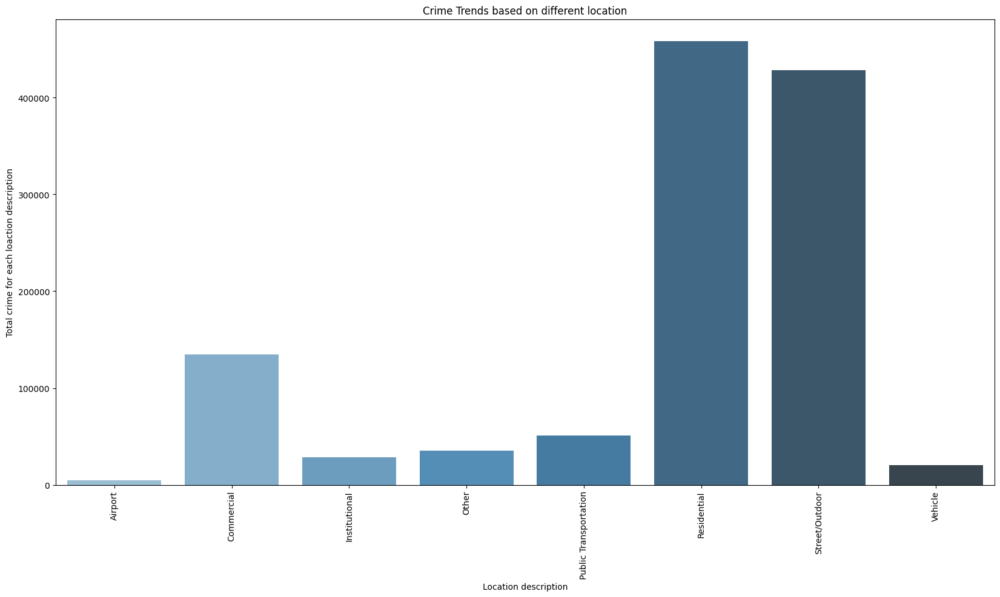

In [22]:
# --- PLOTTING CRIME RATE BASED ON LOCATION DESCRIPTION ---

# Data filter from crime_data
crime_rate_based_on_loc_desc = crime_data.groupby(by=['generalized_loc'], dropna=False, as_index=False).size()
crime_rate_based_on_loc_desc.rename(columns={"size": "count", "generalized_loc": "loc_desc"}, inplace=True)

# Sort the values before plotting
crime_rate_based_on_loc_desc.sort_values("count", ascending=False)

# Plot the crime based on location description
plt.figure(figsize=(20,10))
sns.barplot(x="loc_desc", y="count", data=crime_rate_based_on_loc_desc, palette='Blues_d')
plt.xlabel("Location description")
plt.ylabel("Total crime for each loaction description")
plt.xticks(rotation=90)
plt.title("Crime Trends based on different location")
plt.show()

In [23]:
# Install pydeck for population plot
%pip install pydeck

  Using cached jinja2-3.1.6-py3-none-any.whl.metadata (2.9 kB)
  Using cached MarkupSafe-3.0.2-cp313-cp313-macosx_11_0_arm64.whl.metadata (4.0 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 65.6 MB/s eta 0:00:00
Using cached jinja2-3.1.6-py3-none-any.whl (134 kB)
Using cached MarkupSafe-3.0.2-cp313-cp313-macosx_11_0_arm64.whl (12 kB)
Note: you may need to restart the kernel to use updated packages.


In [11]:
# --- PLOTTING THE CRIME TREND BASED ON LOCATION IN CHICAGO ---

import pydeck as pdk

crime_location_counts = crime_data.groupby(['Lat_round', 'Lon_round']).size().reset_index(name='Count')

# Function to assign colors for better visualization
def assign_color(count):
    if count <= 100:
        return [0, 	186, 225, 255]  # Blue for low counts
    elif count <= 500:
        return [0, 0, 255, 255]
    elif count <= 1500:
        ratio = (count - 500) / (1500 - 500)
        start_color = [255, 255, 224]  # light yellow
        end_color   = [255, 215, 0]    # golden yellow
        r = int(start_color[0] + ratio * (end_color[0] - start_color[0]))
        g = int(start_color[1] + ratio * (end_color[1] - start_color[1]))
        b = int(start_color[2] + ratio * (end_color[2] - start_color[2]))
        return [r, g, b, 255]
    else:
        return [222,80,70]

# Apply the color breakpoints to the DataFrame
crime_location_counts['color'] = crime_location_counts['Count'].apply(assign_color)

# Set up the layer for the map
layer = pdk.Layer(
    type="ColumnLayer",
    data=crime_location_counts,
    get_position=["Lon_round", "Lat_round"],
    get_elevation="Count",
    auto_hightlight =True,
    elevation_scale=0.1,
    pickable=True,
    get_fill_color='color',
    coverage=10
)

# Set the view parameter
view_state = pdk.ViewState(
    latitude=41.8781,    
    longitude=-87.6298,
    zoom=10,
    pitch=0
)

# Render the map to a html file
r = pdk.Deck(
    layers=[layer],
    initial_view_state=view_state,
    tooltip={"html": "<b>Crime Count:</b> {Count}<br/><b>Location:</b> [{Lat_round}, {Lon_round}]"}
)
r.to_html("chicago_crime_map.html")